# random stuff to fit somewhere

#### For new data: remove dodgy images
* Check file type
* Check can be opened by cv2

**Dataset Notes:**
* None of the images contain fully night-time pictures
* All sourced from airliners.net
* as a result of above, all contain a 20px banner on bottom with copyright info

# A320 or 737?

___

## Introduction

I like airplanes, and I have quite a few friends who do too. A lot of our conversations revolve around aircraft types, so my first instinct when I see one in the sky is to try to identify it. Is it a Boeing, an Airbus, or something else? Which model is it...and which variant of said model? There are key features like the shape and size of the wings, fuselage, and engines which allow us humans (or maybe only the aviation nerds) to distinguish aircraft models.

As someone who knew close to nothing about computer vision, I wanted to see whether a model could be trained to identify aircraft like I do with my friends. This project is my first baby step: **can a neural network be trained to differentiate between an Airbus A320 and a Boeing 737?** The A320 and 737 were chosen because they are physically similar, making the problem of classification more interesting than choosing two aircraft that are obviously different (for example, an Airbus A320 and a Boeing 747 are easily distinguished by their size and the number of engines).

If you have any comments, advice, or questions, I'd love to hear from you through LinkedIn - here's [my profile](https://www.linkedin.com/in/kento-seki/)!

Kento Seki<br>29th Dec, 2022

![](https://airplanes.itsabouttravelling.com/wp-content/uploads/2017/12/main-image.jpg)

---

## 1 Project Details

### 1.1 Dataset

I used the _Fine-Grained Visual Classification of Aircraft (FGVC Aircraft)_ dataset published by S. Maji, J. Kannala, E. Rahtu, M. Blaschko and A. Vedaldi. This dataset contains 10,000 labelled images of 70 aircraft types. There were 800 images of Boeing 737s and 400 images of Airbus A320s; no other aircraft types had a larger number of images. So, I selected 400 images of 737s along with the 400 images of A320s to make up the dataset for this project.

Dataset citation: _Fine-Grained Visual Classification of Aircraft_, S. Maji, J. Kannala, E. Rahtu, M. Blaschko, A. Vedaldi, [arXiv.org](http://arxiv.org/abs/1306.5151), 2013


### 1.2 Guidance

Okay, so I said I've never done computer vision before. Nicholas Renotte, in his YouTube tutorial _Build a Deep CNN Image Classifier with ANY Images_ ([link](https://www.youtube.com/watch?v=jztwpsIzEGc&ab_channel=NicholasRenotte)), was my friendly, and very helpful, guide. In this video, he builds a neural network to classify images of people as depicting 'happy' or 'sad' people, and I built my 'A320 vs 737' neural network classifier by following his steps exactly, and using my aircraft dataset instead of his happy/sad dataset.

### 1.3 Wait... what makes this project special then?

I imagine you're asking yourself this given that I followed a YouTube tutorial from start to finish... did I even do any thinking? There were a couple areas, unique to this aicraft classification problem, where I had to investigate for myself:

1. Why does my model, trained according to Nicholas, perform so badly on new images?
2. How should new images be preprocessed to best match the training images?

---

## 2 Setup
### 2.1 Install dependencies

In [1]:
import tensorflow as tf
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import os
import shutil
import cv2
import imghdr

from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout
from tensorflow.keras.metrics import Precision, Recall, BinaryAccuracy

import requests

In [2]:
# Limits tensorflow's GPU Memory Consuption Growth to avoid OOM (out of memory) errors.
# Doesn't actually do anything (on my machine) since Tensorflow GPUs aren't supported for Mac 
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

### 2.2 Extract pictures of A320s and 737s from the full dataset

The images in the full dataset come pre-split into training, testing, and validation sets. Each image is associated with its label in the files `images_family_train.txt`, `images_family_test.txt`, and `images_family_val.txt` by having the aircraft type listed beside each image ID. First, we read in these files and combine the train, test, and validation sets to count how many images of each aircraft type belong in the full dataset. We will create our own train-test-validation split later.

In [3]:
set1 = pd.read_table(os.path.join('full_dataset', 'data', 'images_family_train.txt'), header=None, names=['orig'])
set2 = pd.read_table(os.path.join('full_dataset', 'data', 'images_family_test.txt'), header=None, names=['orig'])
set3 = pd.read_table(os.path.join('full_dataset', 'data', 'images_family_val.txt'), header=None, names=['orig'])

images = pd.concat([set1, set2, set3])
images.shape

(10000, 1)

In [4]:
images.head()

,orig
0,1025794 Boeing 707
1,1340192 Boeing 707
2,0056978 Boeing 707
3,0698580 Boeing 707
4,0450014 Boeing 707


In [5]:
images[['imageID', 'model']] = images.orig.str.split(' ', n=1, expand=True)
images.head()

,orig,imageID,model
0,1025794 Boeing 707,1025794,Boeing 707
1,1340192 Boeing 707,1340192,Boeing 707
2,0056978 Boeing 707,0056978,Boeing 707
3,0698580 Boeing 707,0698580,Boeing 707
4,0450014 Boeing 707,0450014,Boeing 707


In [6]:
images['model'].value_counts()

Boeing 737    800
Boeing 747    400
A320          400
A340          400
Boeing 767    300
             ... 
DH-82         100
DHC-1         100
Boeing 727    100
DR-400        100
Yak-42        100
Name: model, Length: 70, dtype: int64

Above, we see that the full dataset has 800 pictures of 737s and 400 pictures of A320s. Now, we randomly select the IDs of 400 of the 737 images, select the IDs of all 400 of the A320 images, and copy the images with those IDs to a separate folder. This new folder is our dataset for this project.

In [7]:
b737 = images[images['model'] == 'Boeing 737'].sample(n=400, axis=0, random_state=42)
a320 = images[images['model'] == 'A320']

# Get image IDs for class A (A320s) and class B (737s)
imagesA = a320['imageID'].values
imagesB = b737['imageID'].values

In [8]:
# Copy all files with ID in 'imagesA' and 'imagesB' from the entire dataset (10000 images of 70 aicraft types) 
# into separate folders

for idA, idB in zip(imagesA, imagesB):
    srcA = os.path.join('full_dataset', 'data', 'images', idA+'.jpg')
    srcB = os.path.join('full_dataset', 'data', 'images', idB+'.jpg')
    dstA = os.path.join('data', 'a320')
    dstB = os.path.join('data', 'b737')
    
    shutil.copy(srcA, dstA)
    shutil.copy(srcB, dstB)

### 2.3 Crop irrelevant part from images

According to the README in the FGVC Aircraft dataset, each image contains a black banner containing copyright information in the bottom 20 pixels (see example below).

Original image:


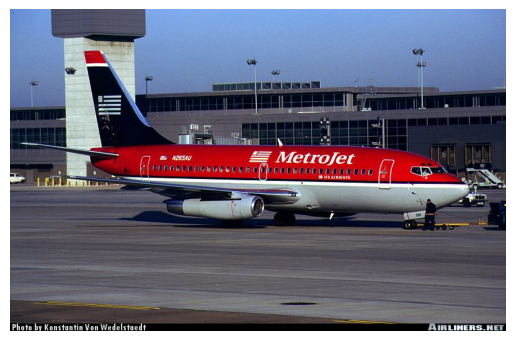

Copyright banner:


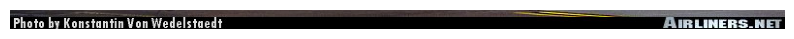

In [9]:
print('Original image:')
img = cv2.imread(os.path.join('full_dataset', 'data', 'images', '0059101.jpg'))
height = img.shape[0]
fig = plt.figure()
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

print('Copyright banner:')
fig2 = plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(img[img.shape[0]-20:], cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

Here, we write a function to crop out the bottom 20 pixels of the images in our dataset, thereby removing the banner.

In [100]:
def removeBanner(parentDir, directoryName):
    '''
    Takes the name of the class directory and removes the 20-pixel copyright banner from the bottom of every 
    image in that directory.
    
    Usage:
        removeBanner('data','a320')
        # This will remove the bottom 20 pixels from all images in the 'data/a320' directory.
    '''
    
    files = os.listdir(os.path.join(parentDir, directoryName))
    for file in files:
        if file == '.DS_Store':
            continue
        filepath = os.path.join(parentDir, directoryName, file)
        img = cv2.imread(filepath)
        height = img.shape[0]
        img = img[:height-20]
        cv2.imwrite(filepath, img)

In [101]:
removeBanner('data','a320')
removeBanner('data','b737')

### 2.4 Load dataset

Tensorflow has a Dataset API `tf.data.Dataset`, but here we use the Keras utility `image_dataset_from_directory` instead. This is because it can create a labelled, resized, shuffled, batched, and split (for CV) image classification dataset in one line - see documentation below.

In [12]:
tf.keras.utils.image_dataset_from_directory??

In [13]:
data = tf.keras.utils.image_dataset_from_directory('data', batch_size=40)

Found 800 files belonging to 2 classes.


Note that the variable `data` is **not** a dataset loaded into memory; it's a generator that'll be used as part of a pipeline. We access portions of the data a time, and this is good because it means we can scale to massive datasets, but it also means we can't simply index an image:

In [14]:
data

<BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

In [15]:
data[0]

TypeError: 'BatchDataset' object is not subscriptable

The easiest way to grab the data is to convert it into a numpy iterator:

In [17]:
data_iterator = data.as_numpy_iterator()
data_iterator

This allows us to grab one batch at a time from the iterator, as follows:

In [18]:
batch = data_iterator.next()
# 'batch' is a tuple containing two elements: a list of arrays (images) and a list of labels

batch[0].shape
# batch size = 32 (by default in image_dataset_from_directory)
# images resized to 256 x 256 (default in ^)
# 3 values for each pixel (RGB)

2023-01-01 12:11:46.559914: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


(40, 256, 256, 3)

In [19]:
# Class labels for the images in batch
batch[1]

array([1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1,
       0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0], dtype=int32)

By plotting a few of the images contained in `batch`, we can see what the resized images look like. 

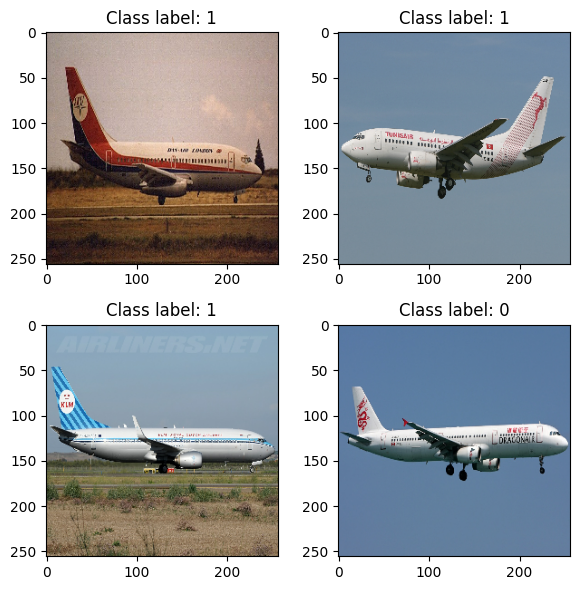

In [20]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(6,6))
for i, ax in enumerate(axes.flat):
    ax.imshow(batch[0][i].astype(int))
    ax.set_title(f'Class label: {batch[1][i]}')

plt.tight_layout()

**Note**: class label 0 is A320; 1 is B737

## 3 Preprocessing

### 3.1 Scale data
Image data is represented by integers ranging from 0 to 255 for each RGB channel for each pixel. Thus, the dimensions of each image are (height x width x 3). The time it takes to train a neural network can be minimised drastically by making the values in the data small - this is why we scale the integers to the range 0 to 1.

In [21]:
scaled_data = data.map(lambda x,y: (x/255, y))    # Using the .map() function, this applies the transformation 
                                                  # within the data pipeline

Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


In [22]:
print(f'max: {scaled_data.as_numpy_iterator().next()[0][0].max()}, min: {scaled_data.as_numpy_iterator().next()[0][0].min()}')    
# Values are now in 0-1 range

max: 1.0, min: 0.003952206112444401


### 3.2 Split data

In [23]:
len(scaled_data)    # 20 batches, each containing 40 images

20

In [24]:
train_size = int(len(scaled_data) * 0.7)
val_size = int(len(scaled_data) * 0.2)
test_size = int(len(scaled_data) * 0.1)

try:
    assert train_size + val_size + test_size == len(scaled_data)
except:
    print('Error: training, validation, and test set sizes do not add up.')

Tensorflow data pipeline functions `take` and `skip` allow us to dictate how many batches should be taken and skipped to create our training, validation, and testing sets. Note that **this is okay because our data has been shuffled already** (in `image_dataset_from_directory`). If it hadn't, we would want to shuffle our dataset before creating the train-test splits.

In [25]:
train = scaled_data.take(train_size)
val = scaled_data.skip(train_size).take(val_size)
test = scaled_data.skip(train_size + val_size).take(test_size)
# train, val, and test now contain the required number of batches
print(f'Number of batches in train, val, test: {len(train)}, {len(val)}, {len(test)} respectively.')

Number of batches in train, val, test: 14, 4, 2 respectively.


## 4. Modelling
We use the tensorflow Sequential API.

### 4.1 Build deep learning model

Here, I blindly follow Nicholas' neural network architecture. I don't know how he arrived at this, and am yet to investigate whether a different architecture will improve the model.

In [26]:
model = Sequential()

model.add(Conv2D(16, (3,3), 1, activation='relu', input_shape=(256,256,3)))
model.add(MaxPooling2D())

model.add(Conv2D(32, (3,3), 1, activation='relu'))
model.add(MaxPooling2D())

model.add(Conv2D(16, (3,3), 1, activation='relu'))
model.add(MaxPooling2D())

model.add(Flatten())

model.add(Dense(256, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

In [27]:
model.compile('adam', loss=tf.losses.BinaryCrossentropy(), metrics=['accuracy', Precision(), Recall()])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 62, 62, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 60, 60, 16)        4624      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 30, 30, 16)       0

### 4.2 Train

In [28]:
logdir = 'logs'
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir = logdir)

In [29]:
hist = model.fit(train, epochs=20, validation_data=val, callbacks=[tensorboard_callback])

Epoch 1/20
14/14 [==============================] - 5s 301ms/step - loss: 0.7536 - accuracy: 0.5107 - precision: 0.5394 - recall: 0.4660 - val_loss: 0.7015 - val_accuracy: 0.4250 - val_precision: 0.4250 - val_recall: 1.0000
Epoch 2/20
14/14 [==============================] - 4s 295ms/step - loss: 0.6884 - accuracy: 0.5321 - precision: 0.5293 - recall: 0.8160 - val_loss: 0.6743 - val_accuracy: 0.5938 - val_precision: 0.5639 - val_recall: 0.9146
Epoch 3/20
14/14 [==============================] - 5s 299ms/step - loss: 0.6595 - accuracy: 0.6411 - precision: 0.6235 - recall: 0.7314 - val_loss: 0.6430 - val_accuracy: 0.6875 - val_precision: 0.7872 - val_recall: 0.4805
Epoch 4/20
14/14 [==============================] - 5s 299ms/step - loss: 0.6084 - accuracy: 0.6786 - precision: 0.6544 - recall: 0.7169 - val_loss: 0.5906 - val_accuracy: 0.8000 - val_precision: 0.8615 - val_recall: 0.7089
Epoch 5/20
14/14 [==============================] - 5s 297ms/step - loss: 0.5303 - accuracy: 0.7643 - pr

We call the return value of `model.fit()` 'hist' here because it contains the history of the loss and other specified metrics of the model throughout training.

In [36]:
hist    # contains training history (see hist.history)

### 4.3 Plot performance

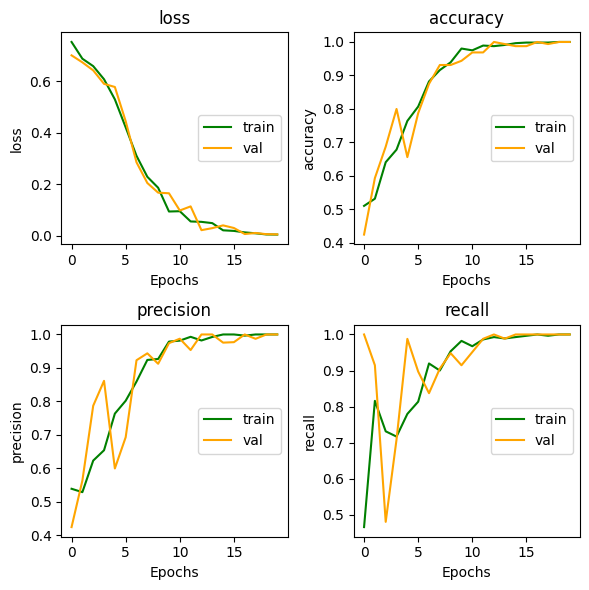

In [32]:
fig, ax = plt.subplots(2,2, figsize=(6,6))

metrics = ['loss', 'accuracy', 'precision', 'recall']

for axis, metric in zip(ax.flat, metrics):
    axis.set_title(metric)
    axis.set_xlabel('Epochs')
    axis.set_ylabel(metric)
    axis.plot(hist.history[metric], color='green', label='train')
    axis.plot(hist.history['val_'+metric],color='orange', label='val')
    axis.legend(loc='right')
    
plt.tight_layout()
plt.show()

## 5 Model evaluation
### 5.1 Evaluate performance on test set

The model's performance using the holdout test set (the subset of data which the model was not exposed to in training) provides an estimate of the model's performance on new, unlabelled data that we take in.

In [37]:
precision = Precision()
recall = Recall()
accuracy = BinaryAccuracy()

In [43]:
# 'test' contains 2 batches, each containing 40 images

for batch in test.as_numpy_iterator():
    X, y = batch
    pred = model.predict(X, verbose=0)
    
    # For debugging...
#     print('This is X:')
#     print(X[0])    # these input Xs are scaled to 0-1 pixel values
#     print(X.shape)
#     print(f'Label: {y[0]}')
#     print(f'Model Output: {pred[0]}')

#     plt.imshow(X[0].astype(int))    # the image appears black because
#                                     # all the pixels are in 0-1 range,
                                      # and then are rounded to integers
#     plt.show()
    
    precision.update_state(y, pred)
    recall.update_state(y, pred)
    accuracy.update_state(y, pred)
    
print(f'Test Precision: {precision.result().numpy()}')
print(f'Test Recall: {recall.result().numpy()}')
print(f'Test Accuracy: {accuracy.result().numpy()}')

Test Precision: 1.0
Test Recall: 1.0
Test Accuracy: 1.0


### 5.2 Test on new images from the internet

Make sure they're not less than 256 x 256

Check and deal with differences in aspect ratio!!!

In [54]:
# Get new image/s by URL

image_urls = [
    'https://upload.wikimedia.org/wikipedia/commons/thumb/9/9e/Delta_Air_Lines_Boeing_737-832%3B_N3747D%40LAX%3B10.10.2011_622in_%286482376485%29.jpg/600px-Delta_Air_Lines_Boeing_737-832%3B_N3747D%40LAX%3B10.10.2011_622in_%286482376485%29.jpg',
    'https://artheauaviation.com/eng/wp-content/uploads/sites/4/2016/10/A320-200.jpg',
    'https://static.wikia.nocookie.net/aircraft/images/d/dd/A320-200.jpg/revision/latest?cb=20130131211248',
    'https://d3lcr32v2pp4l1.cloudfront.net/Pictures/1024x536/5/8/3/86583_a320neotakeoffcairbus_752462.jpg',
    'https://www.qatarairways.com/content/dam/images/renditions/horizontal-1/brand/aircraft/a320/h1-a320-flying.jpg',
    'https://www.anahd.co.jp/group/pr/202104/img/20210426-001.png',
    'https://australianaviation.com.au/wp-content/uploads/2018/07/IMG_3883-CF-770x431.jpg',
    'https://airlinesfleet.com/wp-content/uploads/2019/04/Jetstar-VH-VFH-Airbus-A320-232-on-approach-to-runway-25-at-Sydney-Airport.jpg',
    'https://cdn0.scrvt.com/airportdtm/public/airportdtm/ecd23a592556fb84/1503ea1c5a7d/v/d09400b5874a/B737-700-3.jpg?nowebp=1']
image_files = []

for i, link in enumerate(image_urls):
    img_data = requests.get(link).content
    saved_filename = 'new_test/unknown/' + str(i) + '.jpg'
    with open(saved_filename, 'wb') as handler:
        handler.write(img_data)
    image_files.append(saved_filename)

In [102]:
removeBanner('new_test', 'unknown')

new_test = tf.keras.utils.image_dataset_from_directory('new_test')
scaled_new_test = new_test.map(lambda x,y: (x/255, y))
batch = scaled_new_test.as_numpy_iterator().next()

X_new = batch[0]

Found 14 files belonging to 1 classes.


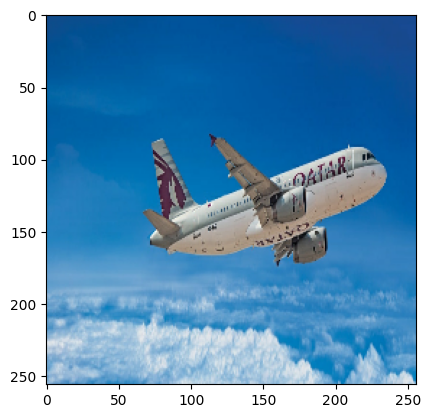

Predict 737 with output 0.82


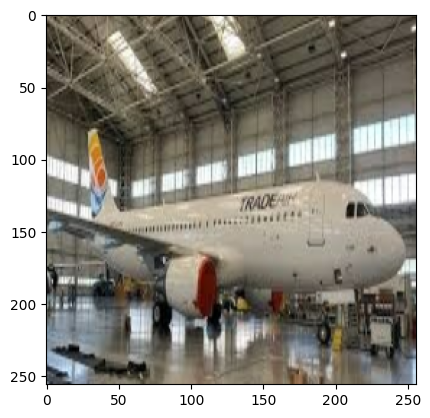

Predict A320 with output 0.0


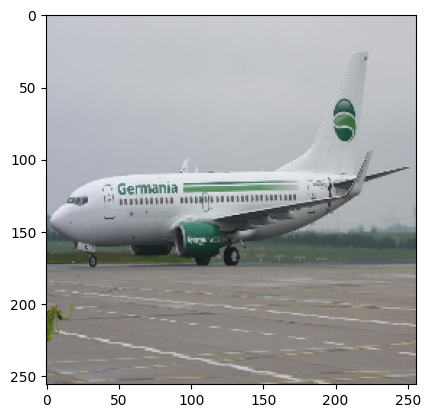

Predict 737 with output 0.97


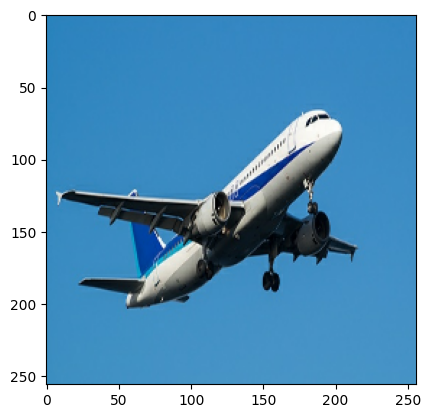

Predict A320 with output 0.02


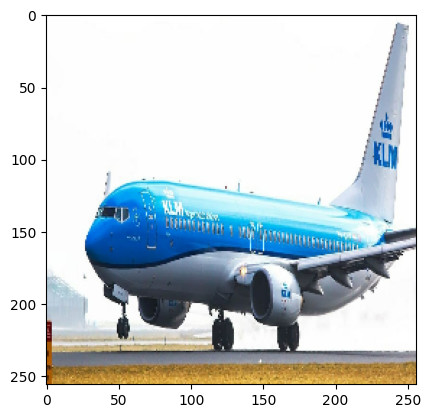

Predict A320 with output 0.1


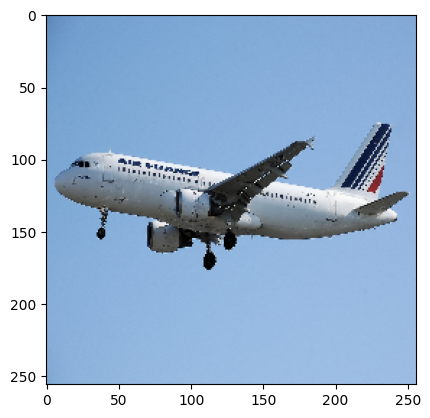

Predict A320 with output 0.01


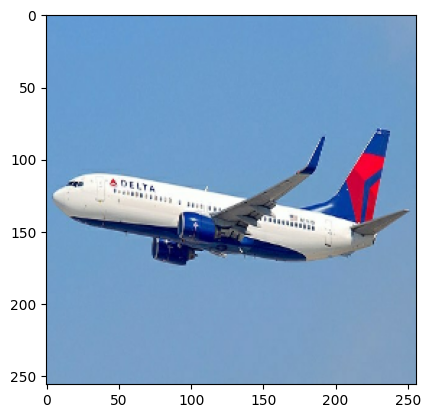

Predict 737 with output 0.7


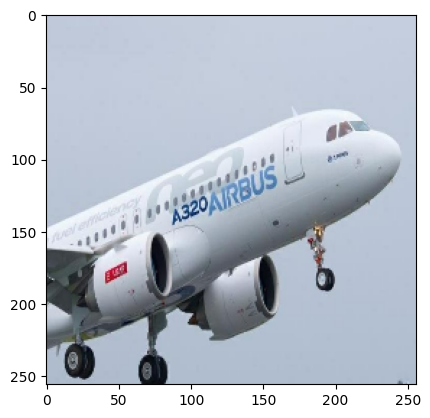

Predict 737 with output 0.99


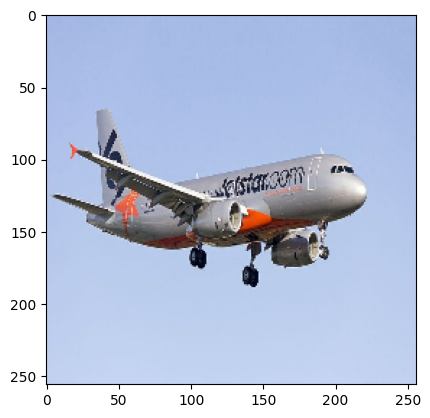

Predict 737 with output 0.74


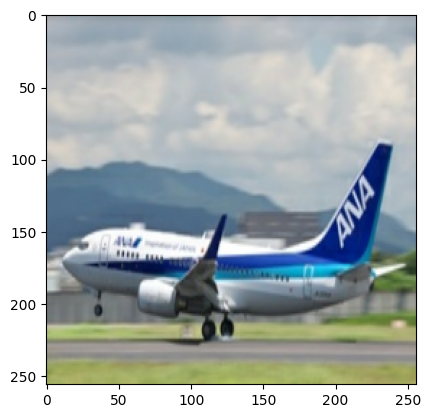

Predict A320 with output 0.0


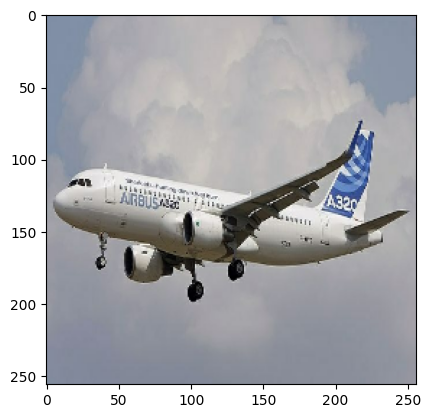

Predict A320 with output 0.0


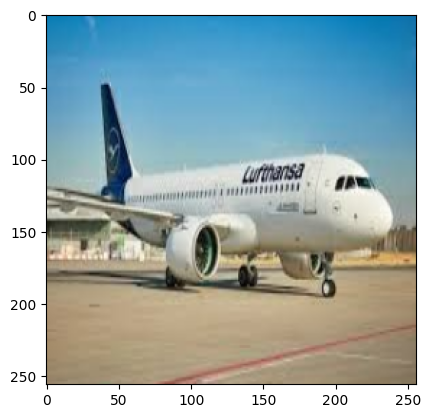

Predict A320 with output 0.05


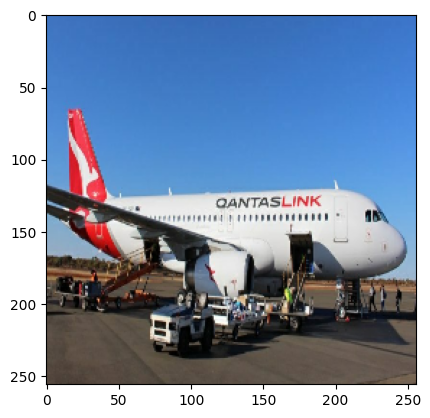

Predict A320 with output 0.0


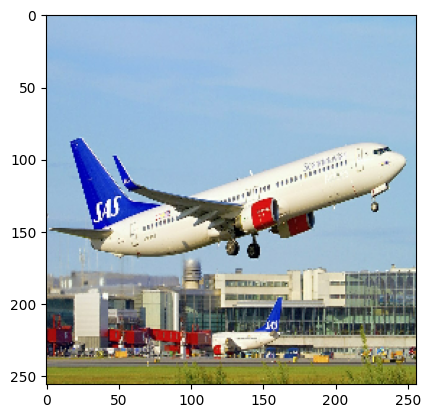

Predict 737 with output 1.0


In [103]:
pred_new = model.predict(X_new, verbose=0)
#print(pred_new)

#plt.imshow(X_new[0].astype(int))

for pred_val, X in zip(pred_new, X_new):
    plt.imshow((X*255).astype(int))
    plt.show()
    
    pred_val = np.float64(pred_val[0])
    if pred_val < 0.5:
        print(f'Predict A320 with output {np.round(pred_val,2)}')
    else:
        print(f'Predict 737 with output {np.round(pred_val,2)}')
        # ^ ...round(), np.round(), and np.around() didn't work because the numbers in pred were numpy.float32's

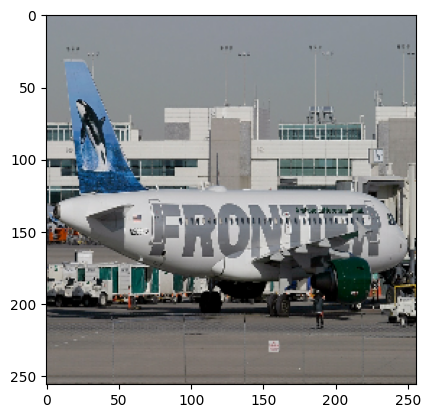

Predict A320 with output 0.01


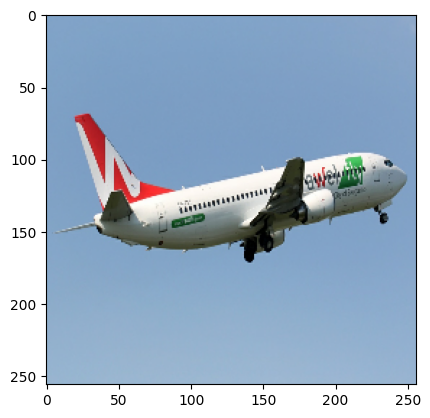

Predict 737 with output 1.0


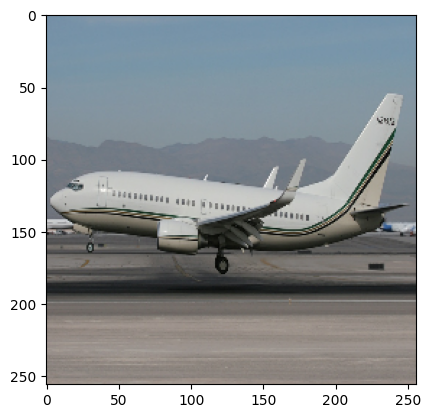

Predict 737 with output 1.0


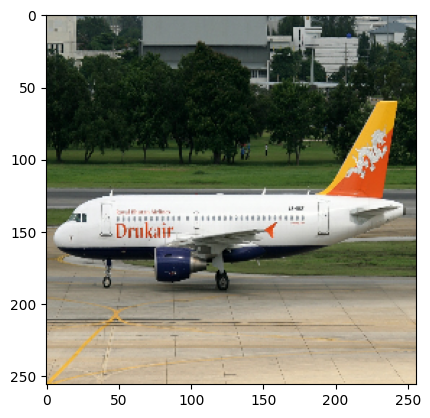

Predict A320 with output 0.0


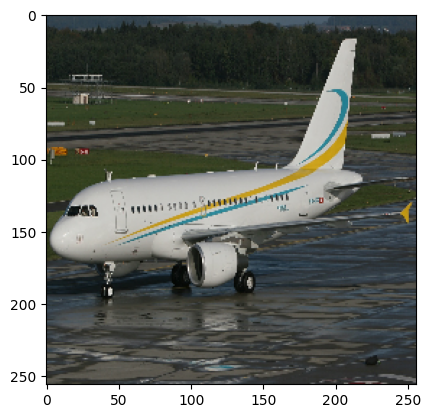

Predict A320 with output 0.0


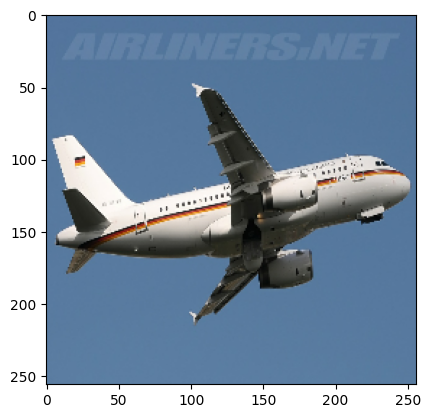

Predict A320 with output 0.0


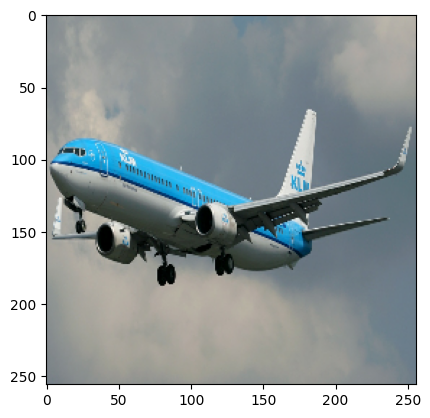

Predict 737 with output 1.0


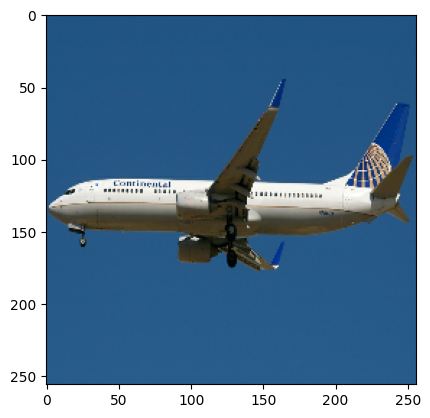

Predict 737 with output 0.99


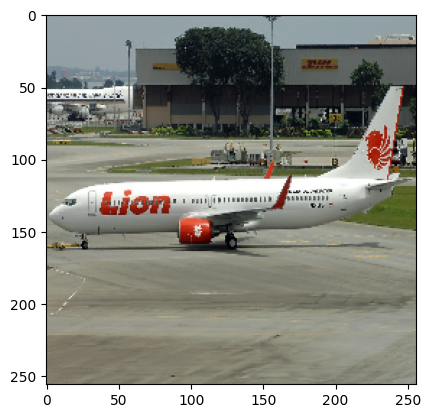

Predict 737 with output 1.0


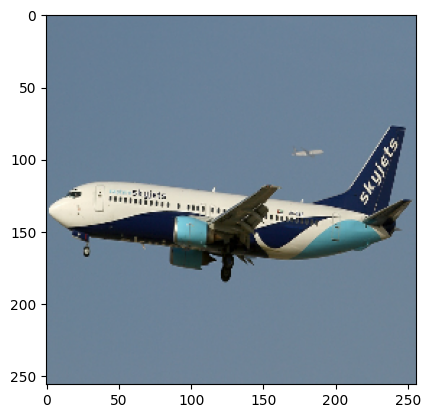

Predict 737 with output 1.0


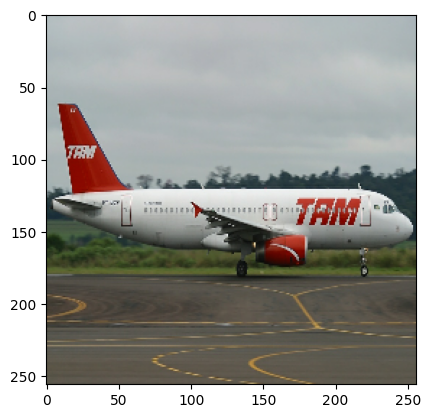

Predict A320 with output 0.0


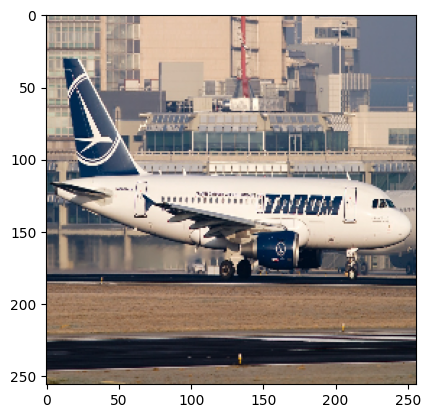

Predict A320 with output 0.0


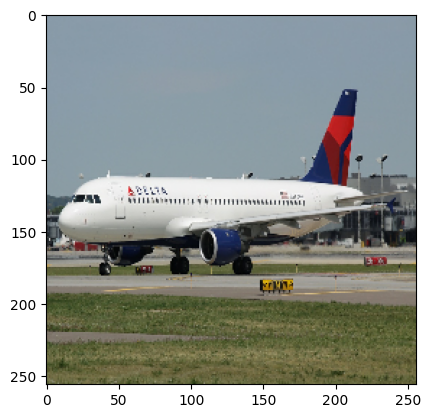

Predict A320 with output 0.0


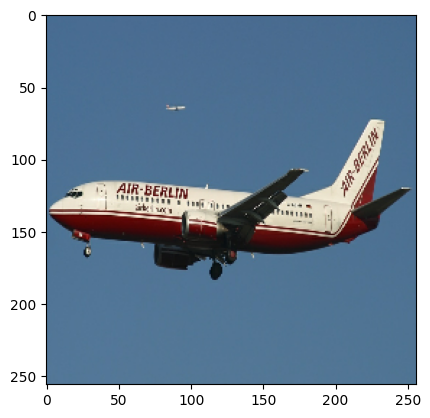

Predict 737 with output 1.0


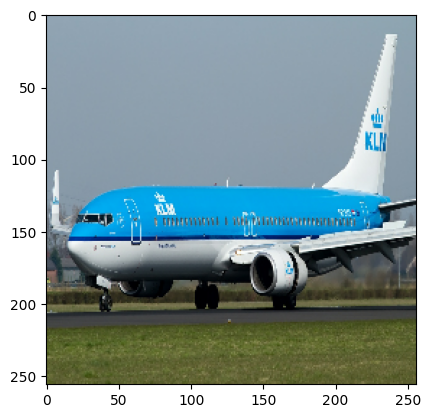

Predict 737 with output 1.0


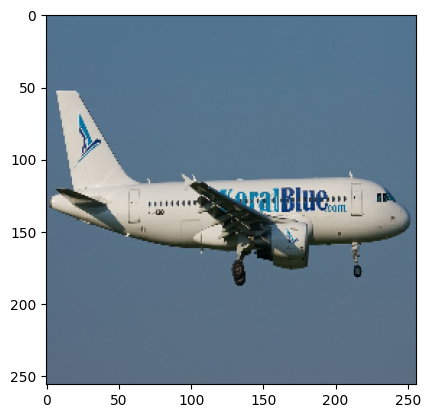

Predict A320 with output 0.0


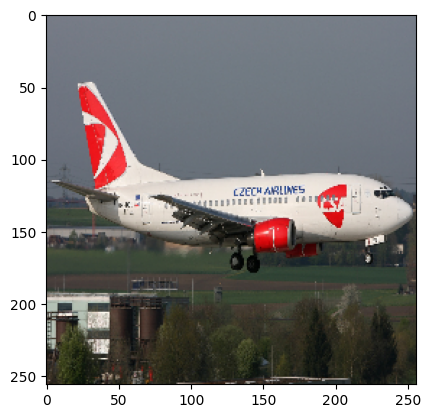

Predict 737 with output 1.0


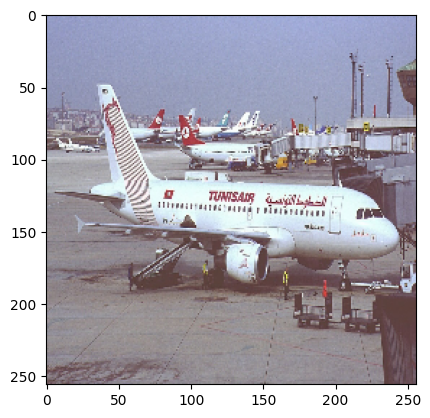

Predict A320 with output 0.0


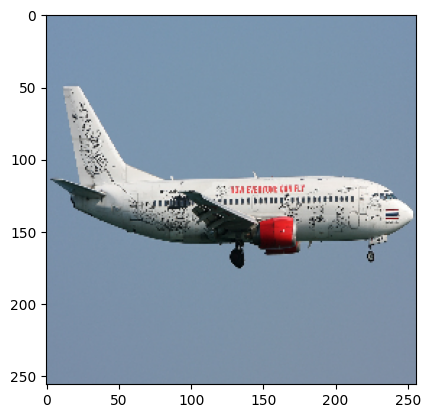

Predict 737 with output 1.0


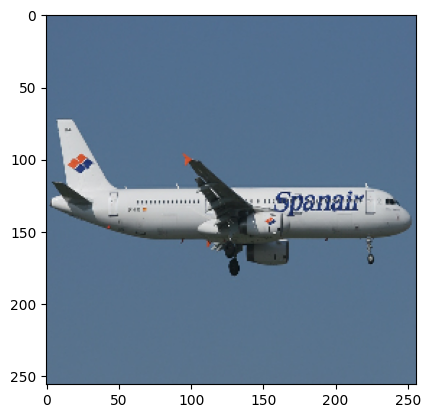

Predict A320 with output 0.0


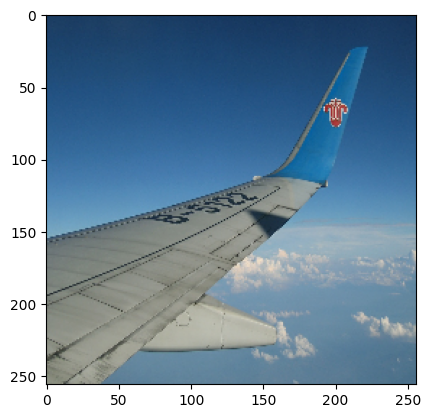

Predict 737 with output 0.99


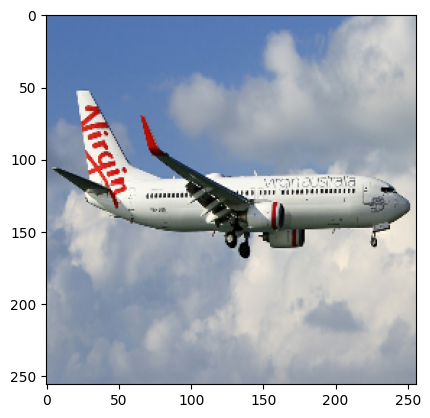

Predict 737 with output 1.0


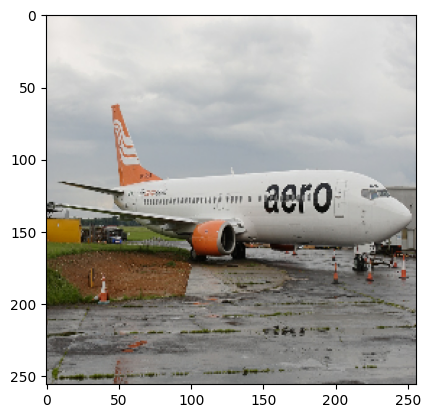

Predict 737 with output 1.0


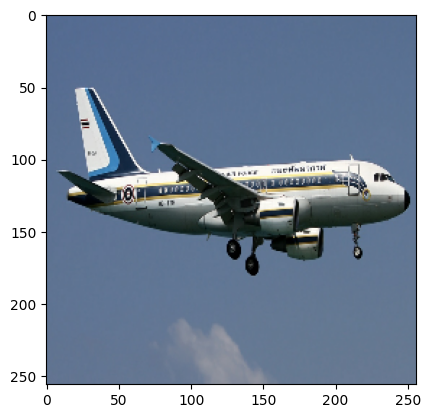

Predict A320 with output 0.0


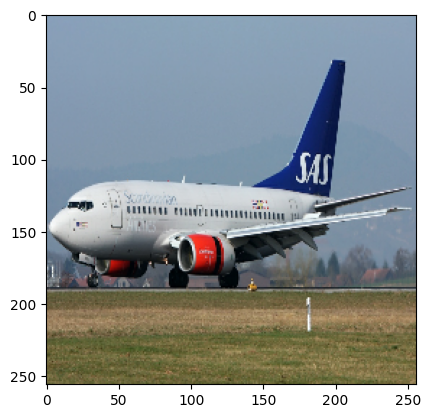

Predict 737 with output 1.0


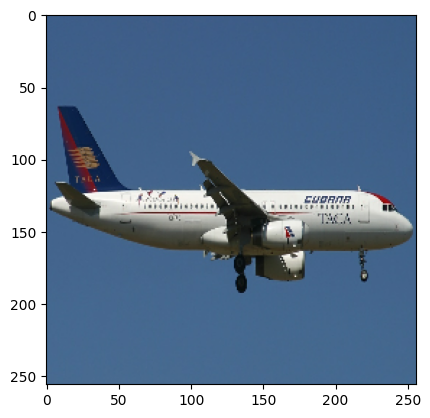

Predict A320 with output 0.0


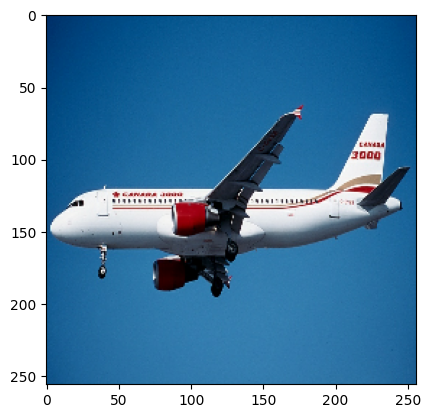

Predict A320 with output 0.0


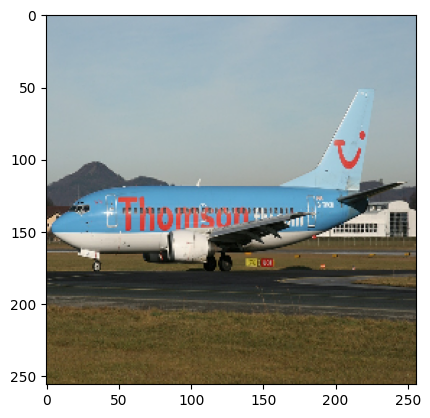

Predict 737 with output 1.0


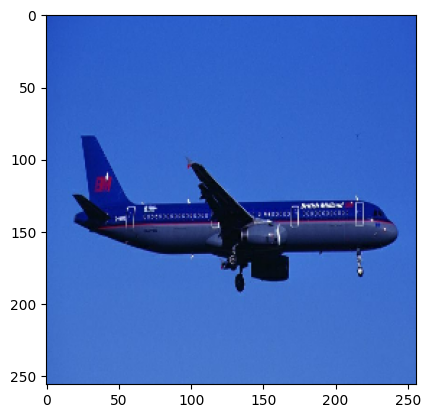

Predict A320 with output 0.01


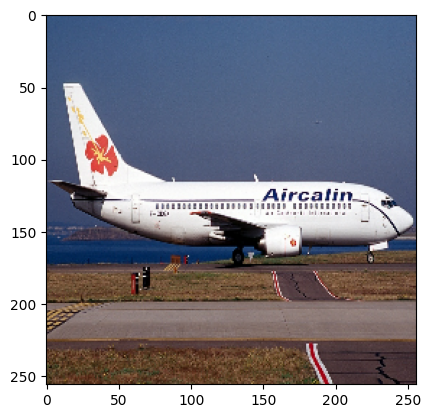

Predict 737 with output 1.0


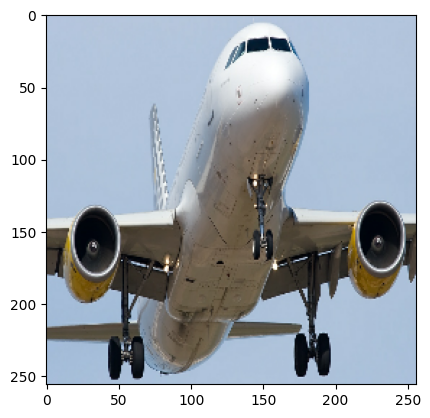

Predict A320 with output 0.0


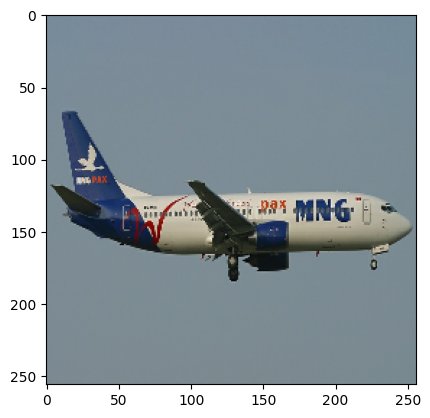

Predict 737 with output 1.0


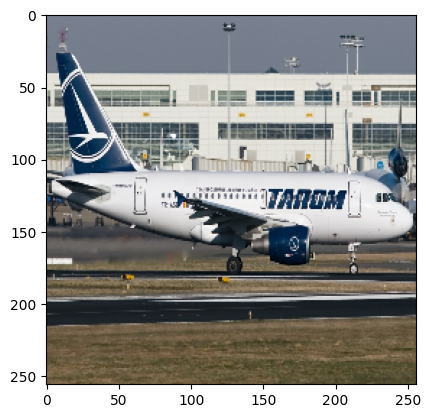

Predict A320 with output 0.0


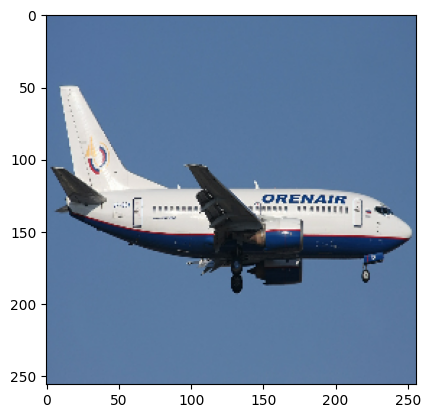

Predict 737 with output 1.0


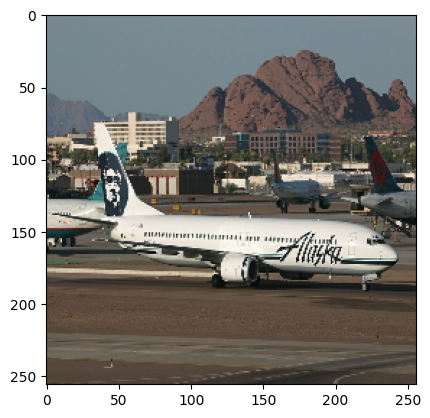

Predict 737 with output 1.0


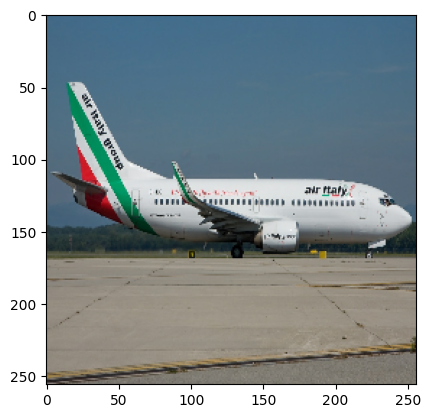

Predict 737 with output 1.0


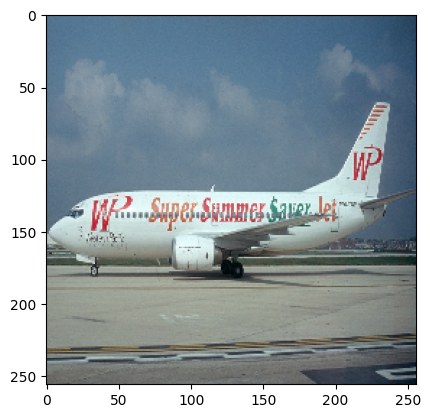

Predict 737 with output 1.0


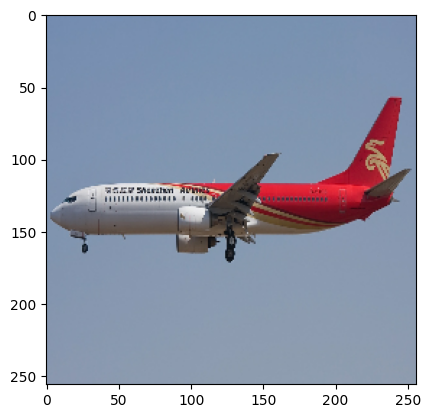

Predict 737 with output 1.0


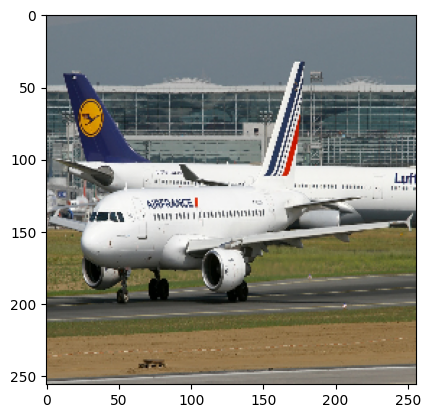

Predict A320 with output 0.0


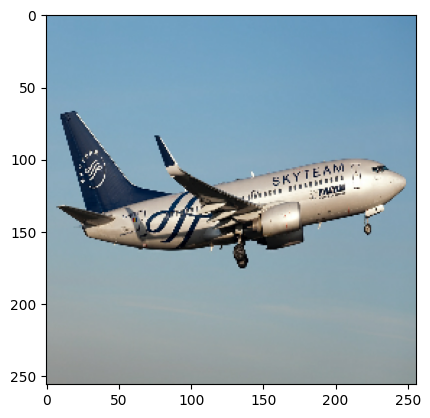

Predict 737 with output 1.0


In [91]:
#### debugging... TEST SET PREDICTIONS ARE PERFECT - why not for the internet pics?

test_batch = test.as_numpy_iterator().next()[0]


test_preds = model.predict(test_batch, verbose=0)
#print(pred_new)

#plt.imshow(X_new[0].astype(int))

for pred_val, X in zip(test_preds, test_batch):
    plt.imshow((X*255).astype(int))
    plt.show()
    
    pred_val = np.float64(pred_val[0])
    if pred_val < 0.5:
        print(f'Predict A320 with output {np.round(pred_val,2)}')
    else:
        print(f'Predict 737 with output {np.round(pred_val,2)}')
        # ^ ...round(), np.round(), and np.around() didn't work because the numbers in pred were numpy.float32's

Observations...
* Why did the model perform poorly on the new images from the internet despite having perfect performance on the test set?
    * The internet images **weren't selected or filtered consistently** - just picked random images from google search. Differences (e.g. picture size and dimensions) affect how the image is resized -- from visual inspection it seems the model misclassifies when the image is compressed (squished) sideways (perhaps due to images with wide aspect ratio)
* Not terrible! **3 misclassified out of 11 completely unseen and arbitrary** (from varying internet sources) images
* The misclassified images tend to have had the aircraft squished horizontally
    * **Future fix**: instead of letting tf automatically resize (and thus sometimes squish) images, make it CROP while maintaining the original aspect ratio?

## 6 Refinement
### 6.1 Resize images by cropping while maintaining the original aspect ratio (as opposed to squishing)

In [ ]:
training_unskewed = tf.keras.utils.image_dataset_from_directory('data', crop_to_aspect_ratio=True)
batch = training_unskewed.as_numpy_iterator().next()

In [ ]:
fig, axes = plt.subplots(2,2, figsize=(8,8))

for i, ax in enumerate(axes.flat):
    ax.imshow(batch[0][i].astype(int))
    

### 6.2 Determine aspect ratios of training images and preprocess all incoming photos to have a similar aspect ratio (minimise the effect of horizontal squishing)

In [59]:
# Iterate through the training images and store their aspect ratios (note that the copyright 
# banners have already been removed)
ratios = []

for idA, idB in zip(imagesA, imagesB):
    imgA = cv2.imread(os.path.join('data', 'a320', idA+'.jpg'))
    imgB = cv2.imread(os.path.join('data', 'b737', idB+'.jpg'))
    
    # store the ratios of width to height
    ratios.append(round(imgA.shape[1]/imgA.shape[0], 2))
    ratios.append(round(imgB.shape[1]/imgB.shape[0], 2))

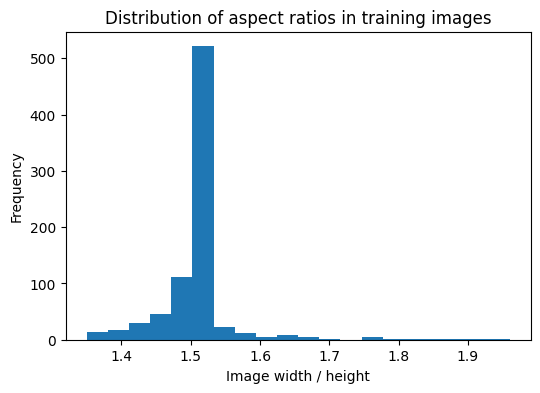

In [60]:
plt.figure(figsize=(6,4))
plt.hist(ratios, bins=20)
plt.title('Distribution of aspect ratios in training images')
plt.xlabel('Image width / height')
plt.ylabel('Frequency')
plt.show()

We see that most photos have an aspect ratio close to 3:2 ($\frac{3}{2}$ = 1.5), with some that are closer to 4:3 ($\frac{4}{3}$ = 1.33). Another common aspect ratio is 16:9 ($\frac{16}{9}$ = 1.78), but the training set contains very few images with this aspect ratio. This is likely due to the fact that the entire image dataset was sourced from a single website, __[airliners.net](https://airliners.net)__.

What were the aspect ratios in the new, arbitrarily sampled, internet images used to test our model?

In [ ]:
tf.keras.utils.image_dataset_from_directory??

In [107]:
new_test = tf.keras.utils.image_dataset_from_directory('new_test', shuffle=False, seed=1)
scaled_new_test = new_test.map(lambda x,y: (x/255, y))
batch = scaled_new_test.as_numpy_iterator().next()

Found 14 files belonging to 1 classes.


In [108]:
testRatios = []

for imgFile in sorted(os.listdir(os.path.join('new_test', 'unknown'))):
    if imgFile == '.DS_Store':
        continue
    img = cv2.imread(os.path.join('new_test', 'unknown', imgFile))
    testRatios.append(round(img.shape[1]/img.shape[0],2))

testRatios

[1.57,
 1.52,
 1.49,
 1.47,
 1.52,
 2.25,
 1.69,
 1.87,
 1.57,
 1.63,
 1.61,
 2.06,
 2.03,
 1.69]

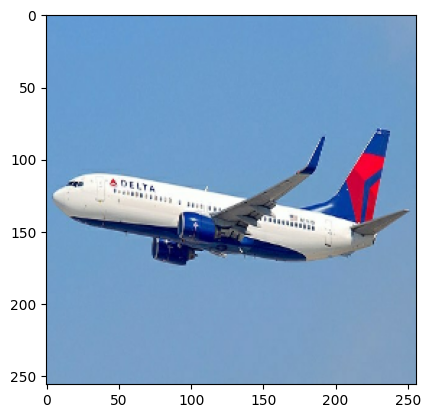

Predict 737 with output 0.7
Width-to-height ratio: 1.57


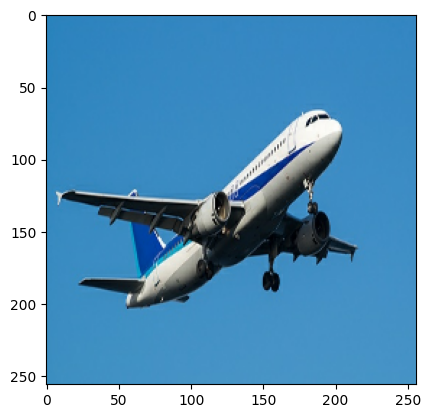

Predict A320 with output 0.02
Width-to-height ratio: 1.52


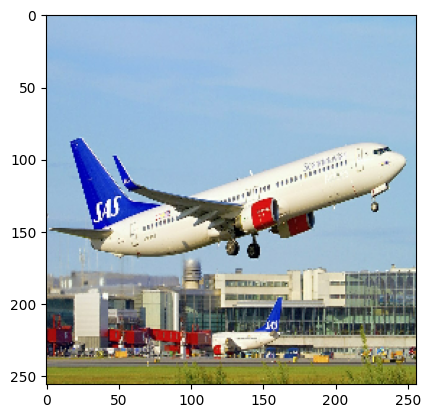

Predict 737 with output 1.0
Width-to-height ratio: 1.49


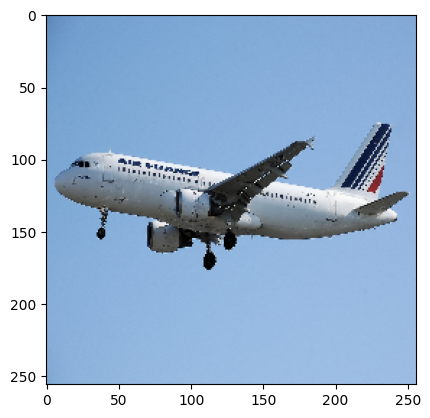

Predict A320 with output 0.01
Width-to-height ratio: 1.47


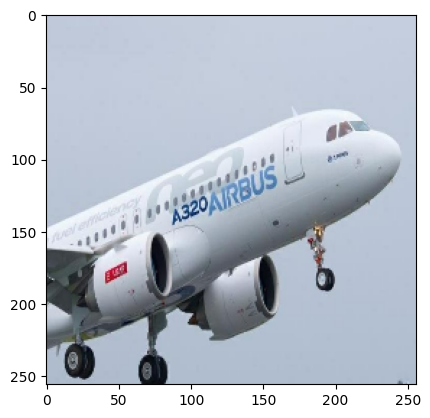

Predict 737 with output 0.99
Width-to-height ratio: 1.52


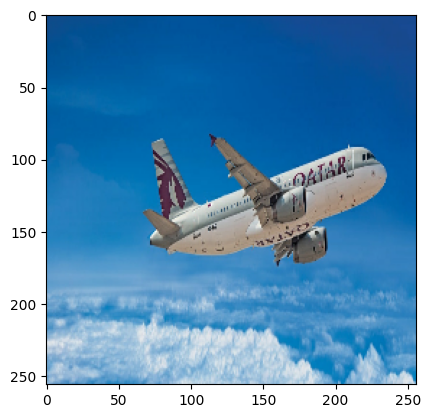

Predict 737 with output 0.82
Width-to-height ratio: 2.25


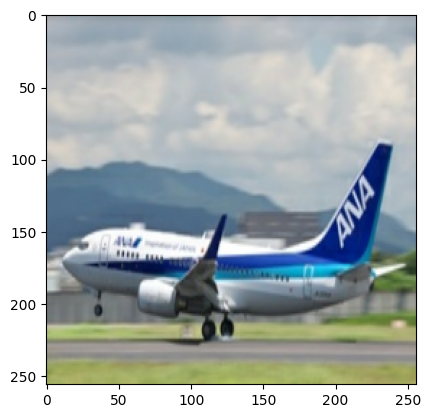

Predict A320 with output 0.0
Width-to-height ratio: 1.69


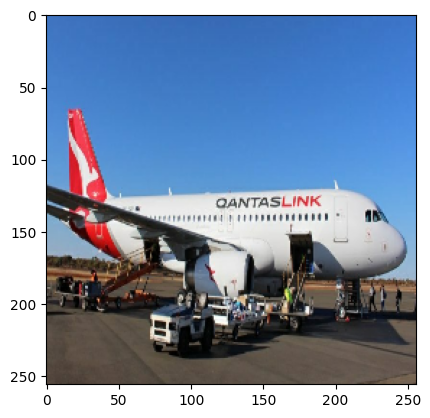

Predict A320 with output 0.0
Width-to-height ratio: 1.87


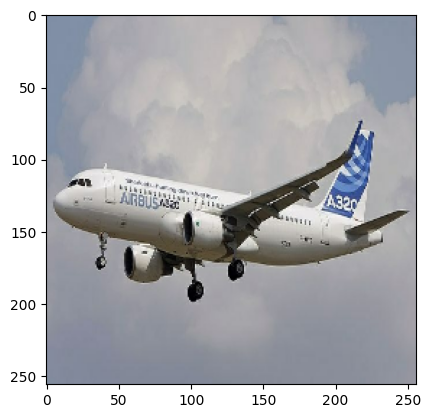

Predict A320 with output 0.0
Width-to-height ratio: 1.57


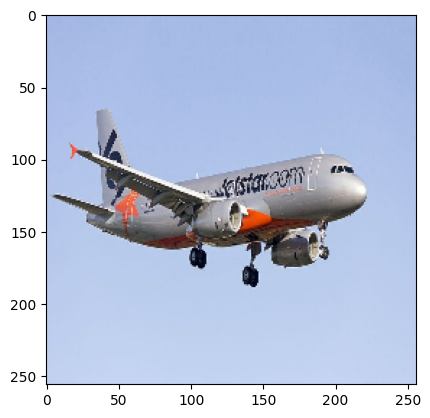

Predict 737 with output 0.74
Width-to-height ratio: 1.63


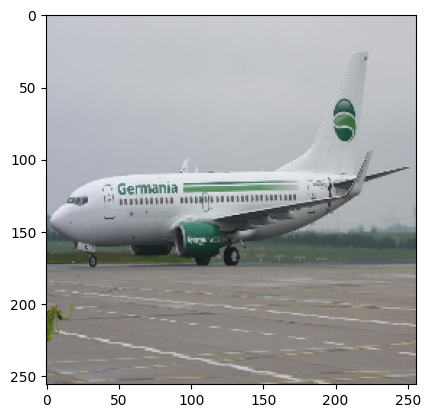

Predict 737 with output 0.97
Width-to-height ratio: 1.61


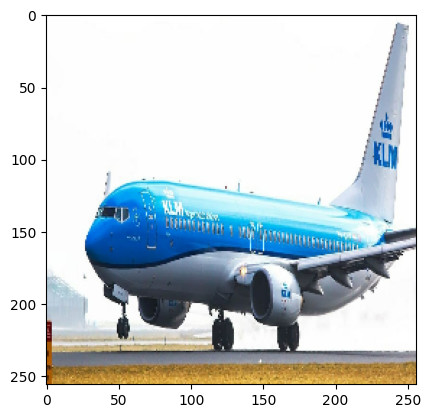

Predict A320 with output 0.1
Width-to-height ratio: 2.06


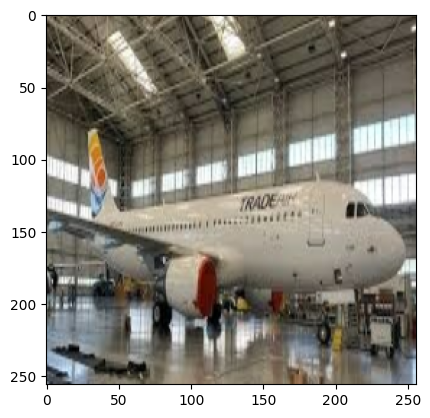

Predict A320 with output 0.0
Width-to-height ratio: 2.03


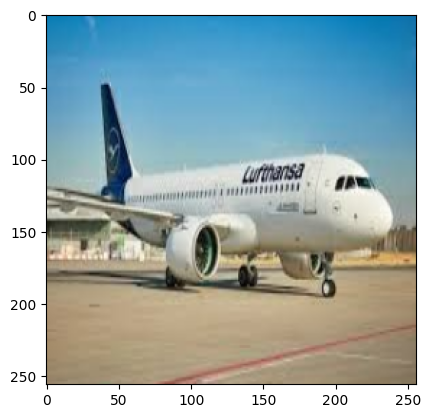

Predict A320 with output 0.05
Width-to-height ratio: 1.69


In [109]:
X_new = batch[0]
pred_new = model.predict(X_new, verbose=0)

for pred_val, X, ratio in zip(pred_new, X_new, testRatios):
    plt.imshow((X*255).astype(int))
    plt.show()
    
    pred_val = np.float64(pred_val[0])
    if pred_val < 0.5:
        print(f'Predict A320 with output {np.round(pred_val,2)}')
    else:
        print(f'Predict 737 with output {np.round(pred_val,2)}')
    
    print(f'Width-to-height ratio: {ratio}')

Now, we can see that only two images to have an abnormally large ratio were misclassified by the model. However, the aspect ratio of the final image (ANA Boeing 737), which was misclassified, does not account for this error; it's ratio is 1.49 - seemingly perfect. One potential reason for this image still being misclassified is that the original image size (275 x 183) was smaller than the resized image used by tensorflow (256 x 256). **Here onwards, we should make sure all new images are larger than 256 x 256 pixels.**

### 6 Save model

In [ ]:
model.save(os.path.join('models', 'a320_b737_model.h5'))

In [ ]:
new_model = load_model(os.path.join('models', 'a320_b737_model.h5'))
new_model

### Other random stuff

In [ ]:
# Code following tutorial... for some reason gives predictions that are always close to 0.5 and quite wrong

img = cv2.imread('data/a320/0062131.jpg')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

resized = tf.image.resize(img, (256,256))
as_batch = np.expand_dims(resized/255, 0)    # expand_dims() adds extra [] around the image since tf expects 
                                             # a batch of data and scales image data
pred = model.predict(as_batch, verbose=0)
output = pred[0][0]
if output < 0.5:
    print(f'Predicted class is Airbus A320 with final output {round(output, 2)}.')
else:
    print(f'Predicted class is Boeing 737 with final output {round(output, 2)}.')
